Problem Statement
A key challenge for property sellers is to determine the sale price of the property. Some are apparent and obvious, and some are not. Nevertheless, a rational approach aided by machine learning can be very useful in predicting the property price. A large data set with 79 different features (like living area, number of rooms, location, etc) along with their prices are provided for residential homes. The challenge is to learn a relationship between the important features and the price. Further, use it to predict the prices of a new set of houses.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

df_price = pd.read_csv("TRAIN.csv")
df_price.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


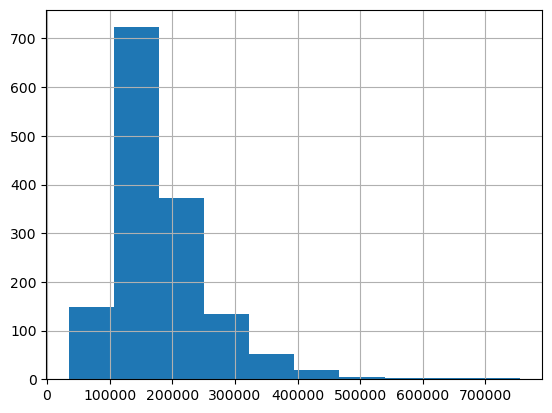

In [3]:
df_price['SalePrice'].hist()
plt.show()

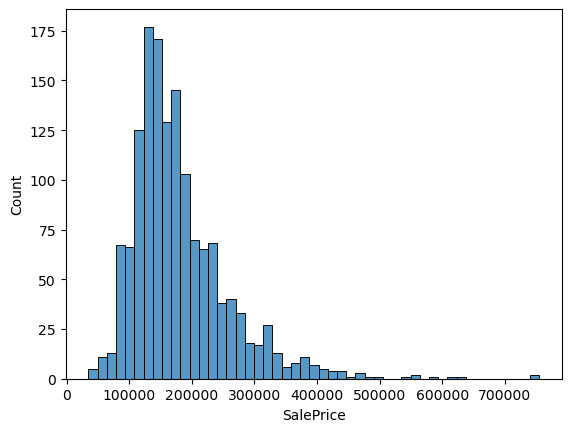

In [4]:
sns.histplot(df_price['SalePrice'])
plt.show()

In [5]:
df_price.drop('Id',axis=1,inplace=True)

In [6]:
df_price.shape

(1460, 80)

**Change the Data Type**

In [7]:
cols =['MSSubClass','OverallQual','OverallCond']

In [8]:
for i in cols:
  df_price[cols]=df_price[cols].astype('object')



In [9]:
df_price.describe()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1201.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,70.049958,10516.828082,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,24.284752,9981.264932,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,21.000000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,59.000000,7553.500000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,80.000000,11601.500000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,313.000000,215245.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [10]:
df_price.describe(include=object)

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,1460,91,1460,1460,1460,1460,1460,1460,...,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,15,5,2,2,4,4,2,5,3,25,...,6,3,5,5,3,3,4,4,9,6
top,20,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,536,1151,1454,50,925,1311,1459,1052,1382,225,...,870,605,1311,1326,1340,3,157,49,1267,1198


In [11]:
(df_price.isnull().sum()/df_price.index.size)*100

MSSubClass        0.000000
MSZoning          0.000000
LotFrontage      17.739726
LotArea           0.000000
Street            0.000000
                   ...    
MoSold            0.000000
YrSold            0.000000
SaleType          0.000000
SaleCondition     0.000000
SalePrice         0.000000
Length: 80, dtype: float64

In [12]:
(df_price.isnull().sum()/(df_price.index.size)*100)[(df_price.isnull().sum()/df_price.index.size)*100  > 0].sort_values(ascending=False)

PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
FireplaceQu     47.260274
LotFrontage     17.739726
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
BsmtExposure     2.602740
BsmtFinType2     2.602740
BsmtFinType1     2.534247
BsmtCond         2.534247
BsmtQual         2.534247
MasVnrArea       0.547945
MasVnrType       0.547945
Electrical       0.068493
dtype: float64

**Missing Values**

1. PoolQC, MiscFeature,Alley and Fence have high values of null.
2. Option is to drop these variables.
3. Instead of dropping, let us do some feature engineering

In [13]:
df_num=df_price.select_dtypes(include=np.number)
df_num= df_num.drop('SalePrice',axis=1)


df_cat =df_price.select_dtypes(exclude=np.number)

In [14]:
df_num.isnull().sum()[df_num.isnull().sum()>0]

LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64

In [15]:
df_cat.isnull().sum()[df_cat.isnull().sum()>0]

Alley           1369
MasVnrType         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

**Univariate Analysis**

In [16]:
cols=list(df_num.columns)
cols

['LotFrontage',
 'LotArea',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MoSold',
 'YrSold']

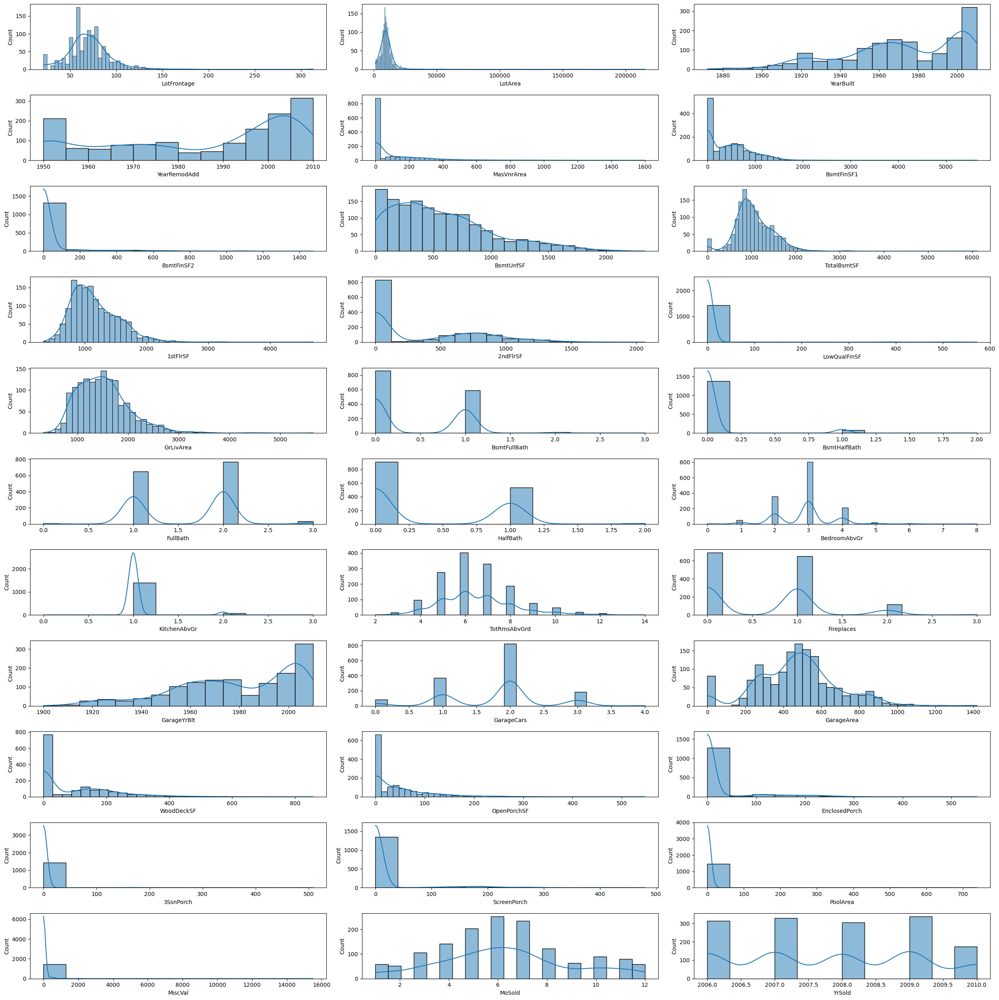

In [17]:
fig, ax= plt.subplots(11,3, figsize=(25,25))

for i, subplot in zip(cols, ax.flatten()):
    sns.histplot(df_price[i], ax=subplot,kde=True)


plt.tight_layout()
plt.show()

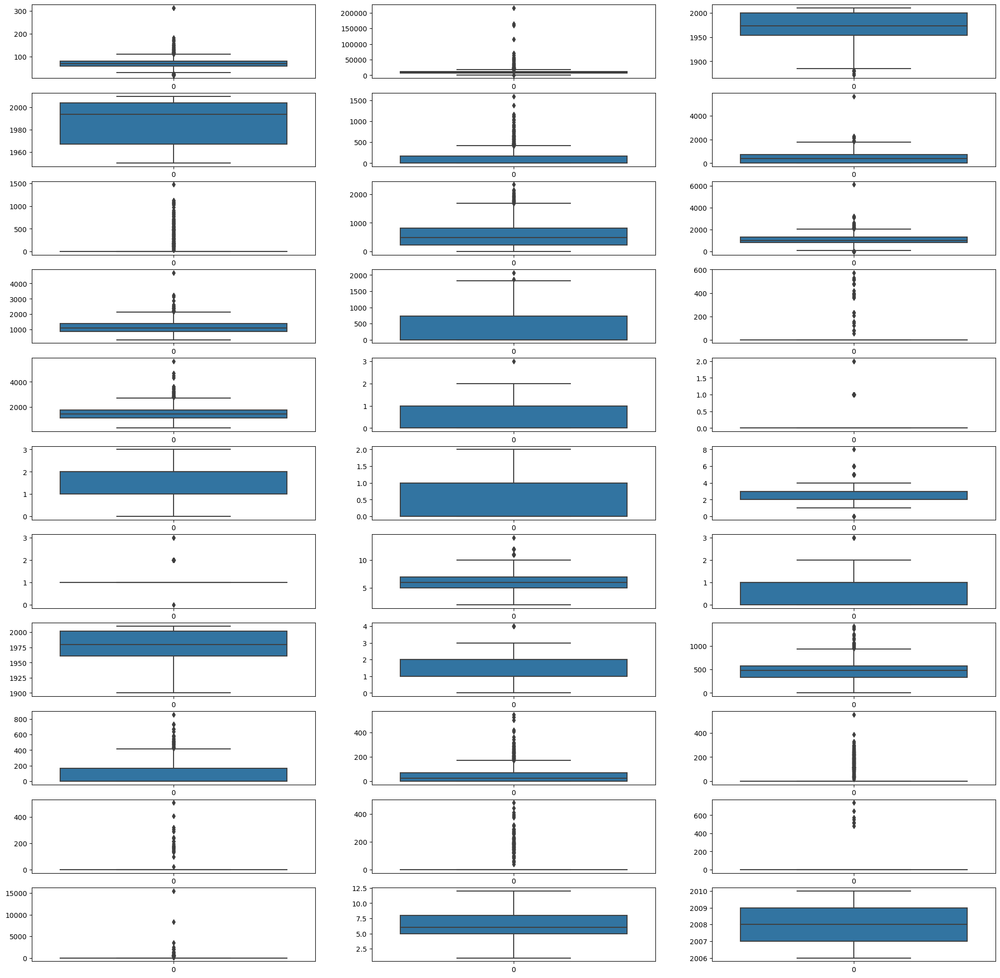

In [18]:
fig, ax=plt.subplots(11,3,figsize=(25,25))
for var, subplot in zip(df_num.columns,ax.flatten()):
  sns.boxplot(df_num[var],ax=subplot)

plt.show()

**Categorical Variables**

In [19]:
df_cat.columns

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')

In [20]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 46 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MSSubClass     1460 non-null   object
 1   MSZoning       1460 non-null   object
 2   Street         1460 non-null   object
 3   Alley          91 non-null     object
 4   LotShape       1460 non-null   object
 5   LandContour    1460 non-null   object
 6   Utilities      1460 non-null   object
 7   LotConfig      1460 non-null   object
 8   LandSlope      1460 non-null   object
 9   Neighborhood   1460 non-null   object
 10  Condition1     1460 non-null   object
 11  Condition2     1460 non-null   object
 12  BldgType       1460 non-null   object
 13  HouseStyle     1460 non-null   object
 14  OverallQual    1460 non-null   object
 15  OverallCond    1460 non-null   object
 16  RoofStyle      1460 non-null   object
 17  RoofMatl       1460 non-null   object
 18  Exterior1st    1460 non-null

**Treatment of Missing values**

In [21]:
df_num['MasVnrArea'].value_counts()

0.0      861
180.0      8
72.0       8
108.0      8
120.0      7
        ... 
562.0      1
89.0       1
921.0      1
762.0      1
119.0      1
Name: MasVnrArea, Length: 327, dtype: int64

**Using KNN Imputer for Imputing Missing Values**

In [22]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df_num_sc= pd.DataFrame(imputer.fit_transform(df_num),columns=df_num.columns)

In [23]:
df_num_sc

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,65.0,8450.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,...,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0
1,80.0,9600.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,...,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0
2,68.0,11250.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,...,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0
3,60.0,9550.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,...,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0
4,84.0,14260.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,...,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917.0,1999.0,2000.0,0.0,0.0,0.0,953.0,953.0,953.0,...,460.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0
1456,85.0,13175.0,1978.0,1988.0,119.0,790.0,163.0,589.0,1542.0,2073.0,...,500.0,349.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2010.0
1457,66.0,9042.0,1941.0,2006.0,0.0,275.0,0.0,877.0,1152.0,1188.0,...,252.0,0.0,60.0,0.0,0.0,0.0,0.0,2500.0,5.0,2010.0
1458,68.0,9717.0,1950.0,1996.0,0.0,49.0,1029.0,0.0,1078.0,1078.0,...,240.0,366.0,0.0,112.0,0.0,0.0,0.0,0.0,4.0,2010.0


In [24]:
df_num_sc.columns

Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [25]:
df_num_sc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 33 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   LotFrontage    1460 non-null   float64
 1   LotArea        1460 non-null   float64
 2   YearBuilt      1460 non-null   float64
 3   YearRemodAdd   1460 non-null   float64
 4   MasVnrArea     1460 non-null   float64
 5   BsmtFinSF1     1460 non-null   float64
 6   BsmtFinSF2     1460 non-null   float64
 7   BsmtUnfSF      1460 non-null   float64
 8   TotalBsmtSF    1460 non-null   float64
 9   1stFlrSF       1460 non-null   float64
 10  2ndFlrSF       1460 non-null   float64
 11  LowQualFinSF   1460 non-null   float64
 12  GrLivArea      1460 non-null   float64
 13  BsmtFullBath   1460 non-null   float64
 14  BsmtHalfBath   1460 non-null   float64
 15  FullBath       1460 non-null   float64
 16  HalfBath       1460 non-null   float64
 17  BedroomAbvGr   1460 non-null   float64
 18  KitchenA

**All the Numeric Numbers are imputed**

**Categorical Variables**

In [26]:
(df_cat.isnull().sum()/(df_price.index.size)*100)[(df_cat.isnull().sum()/df_price.index.size)*100  > 0].sort_values(ascending=False)

PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
FireplaceQu     47.260274
GarageType       5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
BsmtExposure     2.602740
BsmtFinType2     2.602740
BsmtQual         2.534247
BsmtCond         2.534247
BsmtFinType1     2.534247
MasVnrType       0.547945
Electrical       0.068493
dtype: float64

**First 4 variables have to be dealt with differently**

1. Where ever the data is available mark it as 1. Where ever, data is not available mark it as 0.

In [27]:
df_cat.head()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,60,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,20,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,60,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,70,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,...,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,60,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [28]:
df_cat['PoolQC_ava']=df_cat['PoolQC'].replace(np.nan,0).replace('Gd',1).replace('Ex',1).replace('Fa',1)

In [29]:
df_cat['PoolQC_ava'].value_counts()

0    1453
1       7
Name: PoolQC_ava, dtype: int64

In [30]:
df_cat['PoolQC_ava'].value_counts()

0    1453
1       7
Name: PoolQC_ava, dtype: int64

In [31]:
df_cat['MiscFeature_ava']=df_cat['MiscFeature'].replace(np.nan,0)

In [32]:
df_cat['MiscFeature_ava'].value_counts()

0       1406
Shed      49
Gar2       2
Othr       2
TenC       1
Name: MiscFeature_ava, dtype: int64

In [33]:
df_cat['MiscFeature_ava']=df_cat['MiscFeature'].replace(np.nan,0).replace('Shed',1).replace('Gar2',1).replace('Othr',1).replace('TenC',1)

In [34]:
df_cat['MiscFeature_ava'].value_counts()

0    1406
1      54
Name: MiscFeature_ava, dtype: int64

In [35]:
df_cat['Alley_ava']=df_cat['Alley'].replace(np.nan,0)

In [36]:
df_cat['Alley_ava'].value_counts()

0       1369
Grvl      50
Pave      41
Name: Alley_ava, dtype: int64

In [37]:
df_cat['Alley_ava']=df_cat['Alley'].replace(np.nan,0).replace('Grvl',1).replace('Pave',1)

In [38]:
df_cat['Alley_ava'].value_counts()

0    1369
1      91
Name: Alley_ava, dtype: int64

In [39]:
df_cat['Fence_ava']=df_cat['Fence'].replace(np.nan,0)

In [40]:
df_cat['Fence_ava'].value_counts()

0        1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence_ava, dtype: int64

In [41]:
df_cat['Fence_ava']=df_cat['Fence'].replace(np.nan,0).replace('MnPrv',1).replace('GdPrv',1).replace('GdWo',1).replace('MnWw',1)

In [42]:
df_cat['Fence_ava'].value_counts()

0    1179
1     281
Name: Fence_ava, dtype: int64

In [43]:
df_cat['Alley_ava']=df_cat['Alley'].replace(np.nan,0).replace('Grvl',1).replace('Pave',1)

In [44]:
df_cat['FireplaceQu_ava']=df_cat['FireplaceQu'].replace(np.nan,0)

In [45]:
df_cat['FireplaceQu_ava'].value_counts()

0     690
Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu_ava, dtype: int64

In [46]:
df_cat['FireplaceQu_ava']=df_cat['FireplaceQu'].replace(np.nan,0).replace('Gd',1).replace('TA',1).replace('Fa',1).replace('Ex',1).replace('Po',1)

In [47]:
df_cat['FireplaceQu_ava'].value_counts()

1    770
0    690
Name: FireplaceQu_ava, dtype: int64

**All the highly missing values in the columns have been Feature Engineered**

1. Drop the Columns which have Feature Engineered.
2. Drop the old columns and retain the new columns which have Feature Engineering

In [48]:
df_cat.columns

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition',
       'PoolQC_ava', 'MiscFeature_ava', 'Alley_ava', 'Fence_ava',
       'FireplaceQu_ava'],
      dtype='object')

In [49]:
df_cat.drop(['PoolQC','Alley','Fence','FireplaceQu','MiscFeature'],axis=1,inplace=True)

In [50]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 46 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   MSSubClass       1460 non-null   object
 1   MSZoning         1460 non-null   object
 2   Street           1460 non-null   object
 3   LotShape         1460 non-null   object
 4   LandContour      1460 non-null   object
 5   Utilities        1460 non-null   object
 6   LotConfig        1460 non-null   object
 7   LandSlope        1460 non-null   object
 8   Neighborhood     1460 non-null   object
 9   Condition1       1460 non-null   object
 10  Condition2       1460 non-null   object
 11  BldgType         1460 non-null   object
 12  HouseStyle       1460 non-null   object
 13  OverallQual      1460 non-null   object
 14  OverallCond      1460 non-null   object
 15  RoofStyle        1460 non-null   object
 16  RoofMatl         1460 non-null   object
 17  Exterior1st      1460 non-null   

In [51]:
df_cat[['PoolQC_ava','Alley_ava','Fence_ava','FireplaceQu_ava','MiscFeature_ava']].astype(object)

,PoolQC_ava,Alley_ava,Fence_ava,FireplaceQu_ava,MiscFeature_ava
0,0,0,0,0,0
1,0,0,0,1,0
2,0,0,0,1,0
3,0,0,0,1,0
4,0,0,0,1,0
...,...,...,...,...,...
1455,0,0,0,1,0
1456,0,0,1,1,0
1457,0,0,1,1,1
1458,0,0,0,0,0


In [52]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 46 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   MSSubClass       1460 non-null   object
 1   MSZoning         1460 non-null   object
 2   Street           1460 non-null   object
 3   LotShape         1460 non-null   object
 4   LandContour      1460 non-null   object
 5   Utilities        1460 non-null   object
 6   LotConfig        1460 non-null   object
 7   LandSlope        1460 non-null   object
 8   Neighborhood     1460 non-null   object
 9   Condition1       1460 non-null   object
 10  Condition2       1460 non-null   object
 11  BldgType         1460 non-null   object
 12  HouseStyle       1460 non-null   object
 13  OverallQual      1460 non-null   object
 14  OverallCond      1460 non-null   object
 15  RoofStyle        1460 non-null   object
 16  RoofMatl         1460 non-null   object
 17  Exterior1st      1460 non-null   

In [53]:
(df_cat.isnull().sum()/(df_price.index.size)*100)[(df_cat.isnull().sum()/df_price.index.size)*100  > 0].sort_values(ascending=False)

GarageType      5.547945
GarageFinish    5.547945
GarageQual      5.547945
GarageCond      5.547945
BsmtExposure    2.602740
BsmtFinType2    2.602740
BsmtQual        2.534247
BsmtCond        2.534247
BsmtFinType1    2.534247
MasVnrType      0.547945
Electrical      0.068493
dtype: float64

**Impute the rest of the categorical Variables**

In [54]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent',verbose=0)

# fit it on all non object

imputer= imputer.fit(df_cat.iloc[:,:])

In [55]:
df_cat_trans=imputer.transform(df_cat)

In [56]:
df_cat =pd.DataFrame(df_cat_trans,columns=df_cat.columns)

In [57]:
df_num_sc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 33 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   LotFrontage    1460 non-null   float64
 1   LotArea        1460 non-null   float64
 2   YearBuilt      1460 non-null   float64
 3   YearRemodAdd   1460 non-null   float64
 4   MasVnrArea     1460 non-null   float64
 5   BsmtFinSF1     1460 non-null   float64
 6   BsmtFinSF2     1460 non-null   float64
 7   BsmtUnfSF      1460 non-null   float64
 8   TotalBsmtSF    1460 non-null   float64
 9   1stFlrSF       1460 non-null   float64
 10  2ndFlrSF       1460 non-null   float64
 11  LowQualFinSF   1460 non-null   float64
 12  GrLivArea      1460 non-null   float64
 13  BsmtFullBath   1460 non-null   float64
 14  BsmtHalfBath   1460 non-null   float64
 15  FullBath       1460 non-null   float64
 16  HalfBath       1460 non-null   float64
 17  BedroomAbvGr   1460 non-null   float64
 18  KitchenA

In [58]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 46 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   MSSubClass       1460 non-null   object
 1   MSZoning         1460 non-null   object
 2   Street           1460 non-null   object
 3   LotShape         1460 non-null   object
 4   LandContour      1460 non-null   object
 5   Utilities        1460 non-null   object
 6   LotConfig        1460 non-null   object
 7   LandSlope        1460 non-null   object
 8   Neighborhood     1460 non-null   object
 9   Condition1       1460 non-null   object
 10  Condition2       1460 non-null   object
 11  BldgType         1460 non-null   object
 12  HouseStyle       1460 non-null   object
 13  OverallQual      1460 non-null   object
 14  OverallCond      1460 non-null   object
 15  RoofStyle        1460 non-null   object
 16  RoofMatl         1460 non-null   object
 17  Exterior1st      1460 non-null   

In [59]:
print(df_num.shape)
print(df_cat.shape)

(1460, 33)
(1460, 46)


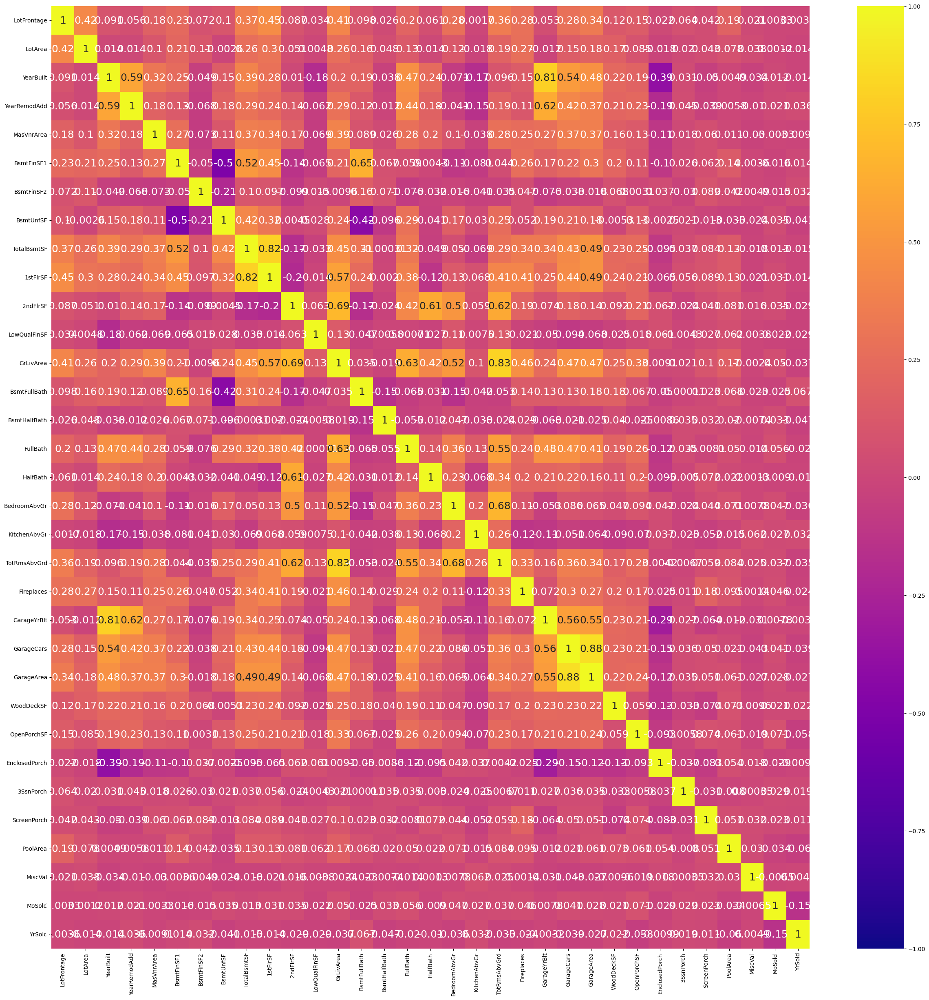

In [60]:
plt.figure(figsize=(30,30))

sns.heatmap(df_num_sc.corr(),
            cmap='plasma',
            vmax=1.0,
            vmin=-1.0,
            annot = True,
            annot_kws={"size": 18})
plt.show()

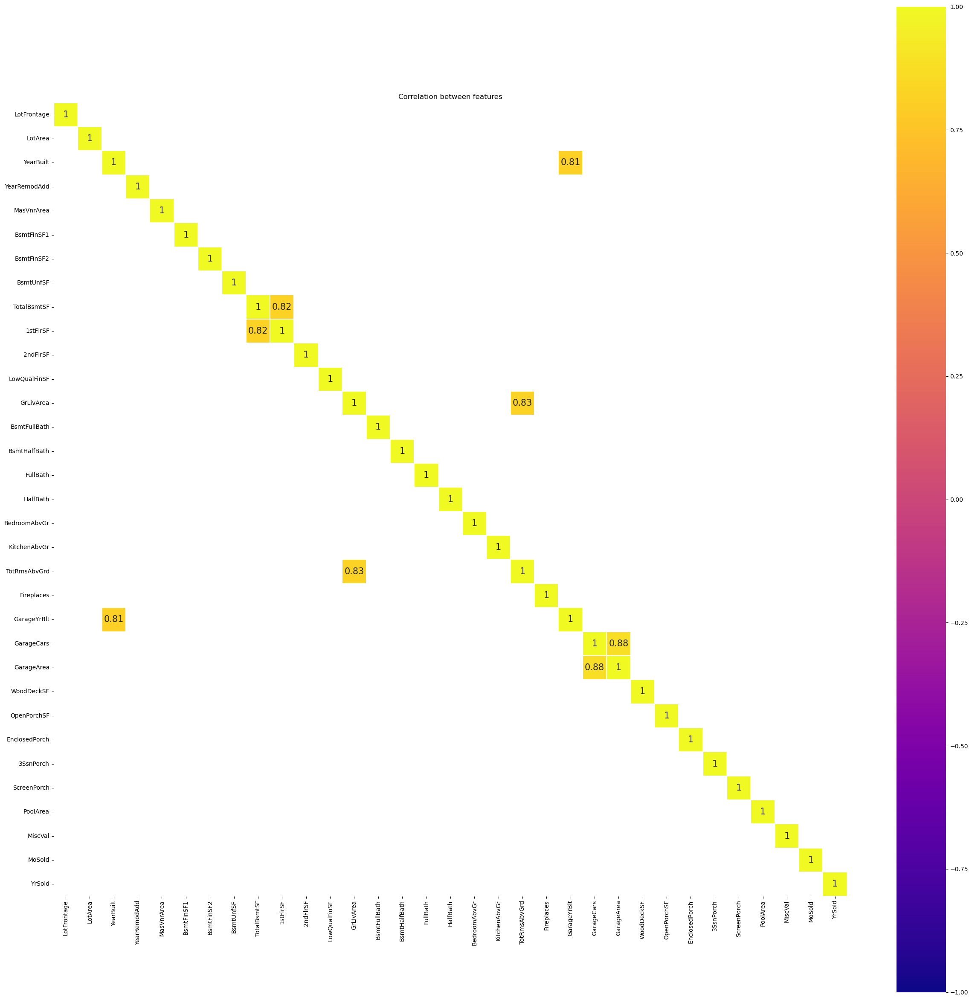

In [61]:


plt.figure(figsize=(30, 30))


sns.heatmap(df_num_sc.corr()[(df_num_sc.corr() >= 0.75) | (df_num_sc.corr() <= -0.75)],
           cmap='plasma',
            vmax=1.0,
            vmin=-1.0,
            annot=True,
            linewidths=0.1,
            annot_kws={"size": 15},
            square=True);

plt.title('Correlation between features')
plt.show()

1. There are few variables which have high correlation between themself leading to multicollinearity

In [62]:
df_num_sc.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,65.0,8450.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,...,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0
1,80.0,9600.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,...,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0
2,68.0,11250.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,...,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0
3,60.0,9550.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,...,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0
4,84.0,14260.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,...,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0


In [63]:
# df_invTrns = pd.DataFrame(sc.inverse_transform(df_num_sc), columns=df_num_sc.columns)
# df_invTrns.head()

In [64]:
df_num.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,...,548,0,61,0,0,0,0,0,2,2008
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,...,460,298,0,0,0,0,0,0,5,2007
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,...,608,0,42,0,0,0,0,0,9,2008
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,...,642,0,35,272,0,0,0,0,2,2006
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,...,836,192,84,0,0,0,0,0,12,2008


**Lets gets Report for Numerical Variables**

In [65]:
pip install pandas_profiling

Note: you may need to restart the kernel to use updated packages.


**PANDAS PROFILING REPORT**

**Report Using SweetViz Library**

In [66]:
pip install sweetviz

Note: you may need to restart the kernel to use updated packages.


In [67]:
import sweetviz as sv
report2_num = sv.analyze(df_num_sc) # only num var 
report2_num.show_html('report2_num_sv.html') # 

                                             |                                             | [  0%]   00:00 ->…

Report report2_num_sv.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


**Auto Visualization Charts-EDA**

In [68]:
pip install AutoViz

In [69]:
df_num_sc.to_csv("HousePr_num_AV.csv")

In [70]:
df_reduced_num1 = df_num_sc[['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath']]

In [71]:
df_reduced_num1.to_csv("HousePr_red_num1_AV.csv")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
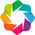

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [72]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

In [73]:
# AV.AutoViz( "HousePr_red_num1_AV.csv")

In [74]:
df = AV.AutoViz( "HousePr_red_num1_AV.csv",
    depVar="",
    dfte=None,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None)


Shape of your Data Set loaded: (1460, 16)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing upto 30 columns max in each category:
    Numeric Columns : ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath']
    Integer-Categorical Columns: []
    String-Categorical Columns: []
    Factor-Categorical Columns: []
    String-Boolean Columns: []
    Numeric-Boolean Columns: []
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: ['Unnamed: 0']
    Columns that will not be considered in modeling: []
    16 Predictors classified...
    

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,0.000000,1459.000000,Possible ID colum: drop before modeling process.
LotFrontage,float64,0.000000,NA,21.000000,313.000000,has 100 outliers greater than upper bound (113.62) or lower than lower bound(27.82). Cap them or remove them.
LotArea,float64,0.000000,NA,1300.000000,215245.000000,has 69 outliers greater than upper bound (17673.50) or lower than lower bound(1481.50). Cap them or remove them.
YearBuilt,float64,0.000000,NA,1872.000000,2010.000000,has 7 outliers greater than upper bound (2069.00) or lower than lower bound(1885.00). Cap them or remove them.
YearRemodAdd,float64,0.000000,NA,1950.000000,2010.000000,No issue
MasVnrArea,float64,0.000000,NA,0.000000,1600.000000,has 98 outliers greater than upper bound (415.00) or lower than lower bound(-249.00). Cap them or remove them.
BsmtFinSF1,float64,0.000000,NA,0.000000,5644.000000,has 7 outliers greater than upper bound (1780.62) or lower than lower bound(-1068.38). Cap them or remove them.
BsmtFinSF2,float64,0.000000,NA,0.000000,1474.000000,has 167 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
BsmtUnfSF,float64,0.000000,NA,0.000000,2336.000000,has 29 outliers greater than upper bound (1685.50) or lower than lower bound(-654.50). Cap them or remove them.
TotalBsmtSF,float64,0.000000,NA,0.000000,6110.000000,has 61 outliers greater than upper bound (2052.00) or lower than lower bound(42.00). Cap them or remove them.


Number of All Scatter Plots = 120
All Plots are saved in .\AutoViz_Plots\AutoViz
Time to run AutoViz = 32 seconds 


In [75]:
df_reduced_num2 = df_num_sc[['FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold']]



df_reduced_num2.to_csv("HousePr_red_num2_AV.csv")

In [76]:
AV = AutoViz_Class()


In [77]:
df = AV.AutoViz( "HousePr_red_num2_AV.csv",
    depVar="",
    dfte=None,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None)

Shape of your Data Set loaded: (1460, 19)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing upto 30 columns max in each category:
    Numeric Columns : ['GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'PoolArea', 'MoSold', 'YrSold']
    Integer-Categorical Columns: []
    String-Categorical Columns: []
    Factor-Categorical Columns: []
    String-Boolean Columns: []
    Numeric-Boolean Columns: []
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: ['Unnamed: 0']
    Columns that will not be considered in modeling: []


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,0.000000,1459.000000,Possible ID colum: drop before modeling process.
FullBath,float64,0.000000,NA,0.000000,3.000000,No issue
HalfBath,float64,0.000000,NA,0.000000,2.000000,No issue
BedroomAbvGr,float64,0.000000,NA,0.000000,8.000000,has 35 outliers greater than upper bound (4.50) or lower than lower bound(0.50). Cap them or remove them.
KitchenAbvGr,float64,0.000000,NA,0.000000,3.000000,has 68 outliers greater than upper bound (1.00) or lower than lower bound(1.00). Cap them or remove them.
TotRmsAbvGrd,float64,0.000000,NA,2.000000,14.000000,has 30 outliers greater than upper bound (10.00) or lower than lower bound(2.00). Cap them or remove them.
Fireplaces,float64,0.000000,NA,0.000000,3.000000,has 5 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
GarageYrBlt,float64,0.000000,NA,1900.000000,2010.000000,No issue
GarageCars,float64,0.000000,NA,0.000000,4.000000,has 5 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
GarageArea,float64,0.000000,NA,0.000000,1418.000000,"has 21 outliers greater than upper bound (938.25) or lower than lower bound(-27.75). Cap them or remove them., has a high correlation with ['GarageCars']. Consider dropping one of them."


Number of All Scatter Plots = 171
All Plots are saved in .\AutoViz_Plots\AutoViz
Time to run AutoViz = 39 seconds 


**Lets gets report for Categorical Variables**

In [78]:
df_cat.head()

,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,PoolQC_ava,MiscFeature_ava,Alley_ava,Fence_ava,FireplaceQu_ava
0,60,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,0
1,20,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,1
2,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,1
3,70,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml,0,0,0,0,1
4,60,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,1


**Report Using Pandas Profiling**

In [79]:
pip install pandas_profiling

Note: you may need to restart the kernel to use updated packages.


In [80]:
report = ProfileReport(df_cat)
report.to_file(output_file='report_cat_pf.html')

NameError: name 'ProfileReport' is not defined

In [ ]:
report

**Report Using Sweet Viz**

In [81]:
report2_cat = sv.analyze(df_cat)
report2_cat.show_html('report2_cat_svz.html')

                                             |                                             | [  0%]   00:00 ->…

Report report2_cat_svz.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


**Report using AutoVisualization **

In [82]:
df_cat.to_csv("HousePr_cat.csv")

In [83]:
df_cat.columns

Index(['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType',
       'SaleCondition', 'PoolQC_ava', 'MiscFeature_ava', 'Alley_ava',
       'Fence_ava', 'FireplaceQu_ava'],
      dtype='object')

In [84]:
from autoviz.AutoViz_Class import AutoViz_Class#Instantiate the AutoViz class
AV = AutoViz_Class()

In [85]:
# AV = AutoViz_Class()
# autovisuals = AV.AutoViz('HousePr_cat.csv')

In [86]:
df_reduced_cat1 = df_cat[['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond']]


df_reduced_cat1.to_csv("HousePr_red_cat1_AV.csv")

df = AV.AutoViz( "HousePr_red_cat1_AV.csv",
    depVar="",
    dfte=None,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None)

Shape of your Data Set loaded: (1460, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing upto 30 columns max in each category:
    Numeric Columns : []
    Integer-Categorical Columns: ['MSSubClass', 'OverallQual', 'OverallCond']
    String-Categorical Columns: ['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond']
    Factor-Categorical Columns: []
    String-Boolean Columns: ['Street', 'Utilities']
    Numeric-Boolean Columns: []
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
  

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,0.000000,1459.000000,Possible ID colum: drop before modeling process.
MSSubClass,int64,0.000000,1,20.000000,190.000000,has 103 outliers greater than upper bound (145.00) or lower than lower bound(-55.00). Cap them or remove them.
MSZoning,object,0.000000,0,nan,nan,1 rare categories: ['C (all)']. Group them into a single category or drop the categories.
Street,object,0.000000,0,nan,nan,1 rare categories: ['Grvl']. Group them into a single category or drop the categories.
LotShape,object,0.000000,0,nan,nan,1 rare categories: ['IR3']. Group them into a single category or drop the categories.
LandContour,object,0.000000,0,nan,nan,No issue
Utilities,object,0.000000,0,nan,nan,1 rare categories: ['NoSeWa']. Group them into a single category or drop the categories.
LotConfig,object,0.000000,0,nan,nan,1 rare categories: ['FR3']. Group them into a single category or drop the categories.
LandSlope,object,0.000000,0,nan,nan,1 rare categories: ['Sev']. Group them into a single category or drop the categories.
Neighborhood,object,0.000000,1,nan,nan,"3 rare categories: ['Veenker', 'NPkVill', 'Blueste']. Group them into a single category or drop the categories."


Number of All Scatter Plots = 6
All Plots are saved in .\AutoViz_Plots\AutoViz
Time to run AutoViz = 15 seconds 


In [87]:
df_reduced_cat2 = df_cat[['BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType',
       'SaleCondition', 'PoolQC_ava', 'MiscFeature_ava', 'Alley_ava',
       'Fence_ava', 'FireplaceQu_ava']]



df_reduced_cat2.to_csv("HousePr_red_cat2_AV.csv")



df = AV.AutoViz( "HousePr_red_cat2_AV.csv",
    depVar="",
    dfte=None,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None)

Shape of your Data Set loaded: (1460, 22)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing upto 30 columns max in each category:
    Numeric Columns : []
    Integer-Categorical Columns: []
    String-Categorical Columns: ['BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
    Factor-Categorical Columns: []
    String-Boolean Columns: ['CentralAir']
    Numeric-Boolean Columns: ['PoolQC_ava', 'MiscFeature_ava', 'Alley_ava', 'Fence_ava', 'FireplaceQu_ava']
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: ['Unnamed: 0'

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,0.000000,1459.000000,Possible ID colum: drop before modeling process.
BsmtExposure,object,0.000000,0,nan,nan,No issue
BsmtFinType1,object,0.000000,0,nan,nan,No issue
BsmtFinType2,object,0.000000,0,nan,nan,1 rare categories: ['GLQ']. Group them into a single category or drop the categories.
Heating,object,0.000000,0,nan,nan,"4 rare categories: ['Grav', 'Wall', 'OthW', 'Floor']. Group them into a single category or drop the categories."
HeatingQC,object,0.000000,0,nan,nan,1 rare categories: ['Po']. Group them into a single category or drop the categories.
CentralAir,object,0.000000,0,nan,nan,No issue
Electrical,object,0.000000,0,nan,nan,"2 rare categories: ['FuseP', 'Mix']. Group them into a single category or drop the categories."
KitchenQual,object,0.000000,0,nan,nan,No issue
Functional,object,0.000000,0,nan,nan,"3 rare categories: ['Maj1', 'Maj2', 'Sev']. Group them into a single category or drop the categories."


Could not draw catscatter plots...
All Plots are saved in .\AutoViz_Plots\AutoViz
Time to run AutoViz = 24 seconds 


In [88]:
###-------------------------------ecoding technique starts here ---------------------------------
###----------------------------------------------------------------------------------------------

In [89]:
pip install category_encoders

Note: you may need to restart the kernel to use updated packages.


In [90]:
import category_encoders as ce

**Example to explain Category Encoding - CATBOOST Technique**

In [91]:
import category_encoders as ce
import pandas as pd


sample_dt = pd.DataFrame({
                      'Salary': ["Low", "Moderate", "Moderate", "High", "Low",
                                 "Moderate", "Moderate", "Moderate", "Low", "Low",
                                 "Low", "High", "Low", "Moderate", "Moderate"

                                 ],

                       'CIBIL':  [250, 650, 680, 800, 275,
                                 680, 675, 680, 200, 275,
                                 300, 820, 300, 690, 720
                                 ],

                      'Premium': [6250, 2231, 23456, 15000, 5600,
                                   5600, 7000, 4560, 8900, 9000,
                                   7688, 5600, 4580, 8900, 7800
                                 ],
                          })

In [92]:
x_sample = sample_dt.drop('Premium', axis=1)
y_sample = sample_dt['Premium']

In [93]:
sample_encode = ce.cat_boost.CatBoostEncoder()
sample_encode.fit(x_sample,y_sample)

sample_output = sample_encode.transform(x_sample)
sample_output

,Salary,CIBIL
0,7166.047619,250
1,8461.416667,650
2,8461.416667,680
3,9581.444444,800
4,7166.047619,275
5,8461.416667,680
6,8461.416667,675
7,8461.416667,680
8,7166.047619,200
9,7166.047619,275


1. High value of Target variable will inflate the encoding value of categorical variable. Hence, transformation of Target variable helps to reduce the skewness.

In [94]:
###--------------------------------------Encoding Ends here=-===================================
###=============================================================================================

**Model Building**

**Lets Build Simple Linear Regression -Base Model**

In [95]:
df_target = np.log(df_price['SalePrice'])

**1. We have not considered any feature selection techniques**

In [96]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error

In [97]:
df_num_sc.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,65.0,8450.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,8.0,0.0,2003.0,2.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0
1,80.0,9600.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,6.0,1.0,1976.0,2.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0
2,68.0,11250.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,6.0,1.0,2001.0,2.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0
3,60.0,9550.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,7.0,1.0,1998.0,3.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0
4,84.0,14260.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,9.0,1.0,2000.0,3.0,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0


In [98]:
print(df_num_sc.shape)
print(df_cat.shape)


(1460, 33)
(1460, 46)


In [99]:
def cat_boost(cat_input,target):

  catboost = ce.cat_boost.CatBoostEncoder()
  catboost.fit(cat_input,target)
  df_encode= round(catboost.transform(cat_input),2)

  return df_encode


In [100]:
def transform(TR):

  # scaling /transformation of the data
  Xtrain_sc = TR.fit_transform(Xtrain.iloc[:,0:33])
  Xtest_sc  = TR.transform(Xtest.iloc[:,0:33])

  # Category encoding
  Xtrain_en =cat_boost(Xtrain.iloc[:,33:79],ytrain)
  Xtest_en  =cat_boost(Xtest.iloc[:,33:79],ytest)

  # Output in DataFrame format-transformed data
  Xtrain_sc= pd.DataFrame(Xtrain_sc,columns = Xtrain.iloc[:,0:33].columns)
  Xtest_sc = pd.DataFrame(Xtest_sc,columns   = Xtest.iloc[:,0:33].columns)

  # Output in DataFrame format-encoded data
  Xtrain_en= pd.DataFrame(Xtrain_en,columns = Xtrain.iloc[:,33:79].columns)
  Xtest_en= pd.DataFrame(Xtest_en,columns  = Xtest.iloc[:,33:79].columns)

  # reseting the index before concatinating
  Xtrain_sc.reset_index(inplace=True)
  Xtrain_en.reset_index(inplace=True)
  Xtest_sc.reset_index(inplace=True)
  Xtest_en.reset_index(inplace=True)


  # concatinating the transformed and encoded data
  Xtrain=pd.concat([Xtrain_sc,Xtrain_en],axis=1)
  Xtest=pd.concat([Xtest_sc,Xtest_en],axis=1)


  return Xtrain,Xtest


In [101]:
df_cat_en = cat_boost(df_cat,df_target)

In [102]:
df_cat_en.head()

,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,PoolQC_ava,MiscFeature_ava,Alley_ava,Fence_ava,FireplaceQu_ava
0,12.34,12.09,12.03,11.94,12.02,12.02,12.00,12.02,12.16,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,11.94,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,11.81
1,12.05,12.09,12.03,11.94,12.02,12.02,12.03,12.02,12.32,11.82,12.03,12.05,11.99,11.97,11.91,11.98,12.02,11.86,11.86,11.90,11.84,12.04,11.87,12.18,12.03,12.36,11.95,12.03,12.03,12.21,12.06,12.06,11.81,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22
2,12.34,12.09,12.03,12.16,12.02,12.02,12.00,12.02,12.16,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,12.09,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22
3,11.97,12.09,12.03,12.16,12.02,12.02,12.03,12.02,12.20,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,11.84,11.90,11.90,11.84,12.04,11.72,11.80,12.22,11.94,11.95,12.03,12.03,11.91,12.06,12.06,12.22,12.04,11.77,11.78,12.03,12.04,12.06,11.99,11.79,12.02,12.03,12.04,12.06,12.22
4,12.34,12.09,12.03,12.16,12.02,12.02,12.03,12.02,12.66,12.04,12.03,12.05,12.18,12.49,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,12.16,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22


In [103]:
df_priceDataset= pd.concat([df_num_sc,df_cat_en],axis=1)
df_priceDataset.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,PoolQC_ava,MiscFeature_ava,Alley_ava,Fence_ava,FireplaceQu_ava
0,65.0,8450.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,8.0,0.0,2003.0,2.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,12.34,12.09,12.03,11.94,12.02,12.02,12.00,12.02,12.16,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,11.94,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,11.81
1,80.0,9600.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,6.0,1.0,1976.0,2.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,12.05,12.09,12.03,11.94,12.02,12.02,12.03,12.02,12.32,11.82,12.03,12.05,11.99,11.97,11.91,11.98,12.02,11.86,11.86,11.90,11.84,12.04,11.87,12.18,12.03,12.36,11.95,12.03,12.03,12.21,12.06,12.06,11.81,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22
2,68.0,11250.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,6.0,1.0,2001.0,2.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,12.34,12.09,12.03,12.16,12.02,12.02,12.00,12.02,12.16,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,12.09,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22
3,60.0,9550.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,7.0,1.0,1998.0,3.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,11.97,12.09,12.03,12.16,12.02,12.02,12.03,12.02,12.20,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,11.84,11.90,11.90,11.84,12.04,11.72,11.80,12.22,11.94,11.95,12.03,12.03,11.91,12.06,12.06,12.22,12.04,11.77,11.78,12.03,12.04,12.06,11.99,11.79,12.02,12.03,12.04,12.06,12.22
4,84.0,14260.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,9.0,1.0,2000.0,3.0,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,12.34,12.09,12.03,12.16,12.02,12.02,12.03,12.02,12.66,12.04,12.03,12.05,12.18,12.49,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,12.16,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22


In [104]:
X=df_priceDataset
y=df_target

**Split the Data -Into Train and Test**

In [105]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X,
                                                y,
                                                test_size= .30,
                                                random_state=0)

**Using SKLearns - Linear Regression Method**

In [106]:
lr=LinearRegression()

# build the model and find the r2score with RMSE

model_lr = lr.fit(Xtrain,ytrain)

pred_train = model_lr.predict(Xtrain)

pred_test=model_lr.predict(Xtest)

In [107]:
r2_train = r2_score(ytrain,pred_train)
r2_test =  r2_score(ytest ,pred_test)

print("R2 Train: ", r2_train)
print("R2 Test:  ", r2_test)

R2 Train:  0.9145753522264809
R2 Test:   0.8431534693650544


**Calculate the RMSE values**

In [108]:
# Mean Squared Error

print("RMSE Train :", np.sqrt(mean_squared_error(ytrain, pred_train)))

print("RMSE Test  :", np.sqrt(mean_squared_error(ytest, pred_test)))

RMSE Train : 0.11747882535053471
RMSE Test  : 0.1556744534318184


**Using the OLS Method -Statistical Way**

In [109]:
import statsmodels.api as sma

temp_x = sma.add_constant(X)
x_train,x_test,y_train,y_test = train_test_split(temp_x,
                                                 y,
                                                 test_size=0.30,
                                                 random_state=0)

In [110]:
model = sma.OLS(y_train,x_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.915
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     133.1
Date:                Fri, 20 Oct 2023   Prob (F-statistic):               0.00
Time:                        14:02:10   Log-Likelihood:                 738.45
No. Observations:                1022   AIC:                            -1323.
Df Residuals:                     945   BIC:                            -943.3
Df Model:                          76                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
LotFrontage         0.0004      0.000      1.788      0.074   -4.13e-05       0.001
LotArea          1.387e-06   4.93e-07      2.814      0.005     4.2e-07    2.35e-06
YearBuilt          -0.0009      0.000     -2.276      0.023      -0.002      -0.000
YearRemodAdd        0.0016      0.000      5.282      0.000       0.001       0.002
MasVnrArea       -1.73e-05   2.99e-05     -0.578      0.563   -7.61e-05    4.15e-05
BsmtFinSF1        4.89e-05    1.2e-05      4.073      0.000    2.53e-05    7.25e-05
BsmtFinSF2       3.842e-05   2.12e-05      1.809      0.071   -3.27e-06    8.01e-05
BsmtUnfSF       -1.013e-05   1.12e-05     -0.905      0.366   -3.21e-05    1.18e-05
TotalBsmtSF      7.718e-05   1.53e-05      5.032      0.000    4.71e-05       0.000
1stFlrSF         5.327e-05   2.77e-05      1.921      0.055   -1.15e-06       0.000
2ndFlrSF         3.052e-05   2.61e-05      1.169      0.243   -2.07e-05    8.18e-05
LowQualFinSF     5.283e-05   6.78e-05      0.779      0.436   -8.03e-05       0.000
GrLivArea           0.0001   2.64e-05      5.170      0.000    8.48e-05       0.000
BsmtFullBath        0.0294      0.012      2.518      0.012       0.006       0.052
BsmtHalfBath        0.0154      0.018      0.835      0.404      -0.021       0.052
FullBath            0.0227      0.013      1.786      0.074      -0.002       0.048
HalfBath            0.0375      0.012      3.060      0.002       0.013       0.062
BedroomAbvGr        0.0181      0.008      2.305      0.021       0.003       0.034
KitchenAbvGr       -0.0473      0.026     -1.812      0.070      -0.099       0.004
TotRmsAbvGrd        0.0073      0.005      1.328      0.184      -0.003       0.018
Fireplaces          0.0345      0.016      2.223      0.026       0.004       0.065
GarageYrBlt        -0.0009      0.000     -2.550      0.011      -0.002      -0.000
GarageCars          0.0120      0.013      0.895      0.371      -0.014       0.038
GarageArea          0.0002   4.62e-05      3.330      0.001    6.32e-05       0.000
WoodDeckSF          0.0001   3.45e-05      2.990      0.003    3.54e-05       0.000
OpenPorchSF      1.509e-05   6.45e-05      0.234      0.815      -0.000       0.000
EnclosedPorch    2.243e-05   7.11e-05      0.316      0.752      -0.000       0.000
3SsnPorch           0.0002      0.000      1.345      0.179   -8.46e-05       0.000
ScreenPorch         0.0002   7.44e-05      3.146      0.002    8.81e-05       0.000
PoolArea            0.0024      0.001      2.979      0.003       0.001       0.004
MiscVal          1.548e-06    7.6e-06      0.204      0.839   -1.34e-05    1.65e-05
MoSold             -0.0016      0.001     -1.102      0.271      -0.005       0.001
YrSold             -0.0040      0.003     -1.290      0.197      -0.010       0.002
MSSubClass          0.0811      0.031      2.590      0.010

**Check the performance by scaling the Data**

In [111]:
df_priceDataset= pd.concat([df_num_sc,df_cat],axis=1)
df_priceDataset.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,PoolQC_ava,MiscFeature_ava,Alley_ava,Fence_ava,FireplaceQu_ava
0,65.0,8450.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,8.0,0.0,2003.0,2.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,60,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,0
1,80.0,9600.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,6.0,1.0,1976.0,2.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,20,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,1
2,68.0,11250.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,6.0,1.0,2001.0,2.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,1
3,60.0,9550.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,7.0,1.0,1998.0,3.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,70,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml,0,0,0,0,1
4,84.0,14260.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,9.0,1.0,2000.0,3.0,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,60,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal,0,0,0,0,1


In [112]:
from sklearn.preprocessing import StandardScaler
X=df_priceDataset
y=df_target

In [113]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X,
                                                y,
                                                test_size= .30,
                                                random_state=0)



In [114]:
sc=StandardScaler()

Xtrain_sc = sc.fit_transform(Xtrain.iloc[:,0:33])
Xtest_sc  = sc.transform(Xtest.iloc[:,0:33])

Xtrain_en =cat_boost(Xtrain.iloc[:,33:79],ytrain)
Xtest_en =cat_boost(Xtest.iloc[:,33:79],ytest)



In [115]:
Xtrain_sc= pd.DataFrame(Xtrain_sc,columns = Xtrain.iloc[:,0:33].columns)
Xtest_sc = pd.DataFrame(Xtest_sc,columns   = Xtest.iloc[:,0:33].columns)

Xtrain_en= pd.DataFrame(Xtrain_en,columns = Xtrain.iloc[:,33:79].columns)
Xtest_en= pd.DataFrame(Xtest_en,columns  = Xtest.iloc[:,33:79].columns)


In [116]:
Xtrain_sc.reset_index(inplace=True)
Xtrain_en.reset_index(inplace=True)
Xtest_sc.reset_index(inplace=True)
Xtest_en.reset_index(inplace=True)

In [117]:
Xtrain=pd.concat([Xtrain_sc,Xtrain_en],axis=1)
Xtest=pd.concat([Xtest_sc,Xtest_en],axis=1)

In [118]:
lr = LinearRegression()
lr.fit(Xtrain,ytrain)


print("Training R2")
print(lr.score(Xtrain,ytrain))


print("Testing R2")
print(lr.score(Xtest,ytest))

Training R2
0.9129952264143576
Testing R2
0.8533067099085583


Inference:-
1. Scaling of the data does not have any impact on the performance of the model.

**Feature Selection and Use Of Pipeline**

In [119]:
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE,SelectFromModel
from sklearn.ensemble import RandomForestRegressor

In [120]:
df_priceDataset= pd.concat([df_num_sc,df_cat_en],axis=1)
df_priceDataset.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,PoolQC_ava,MiscFeature_ava,Alley_ava,Fence_ava,FireplaceQu_ava
0,65.0,8450.0,2003.0,2003.0,196.0,706.0,0.0,150.0,856.0,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,8.0,0.0,2003.0,2.0,548.0,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,12.34,12.09,12.03,11.94,12.02,12.02,12.00,12.02,12.16,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,11.94,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,11.81
1,80.0,9600.0,1976.0,1976.0,0.0,978.0,0.0,284.0,1262.0,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,6.0,1.0,1976.0,2.0,460.0,298.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,12.05,12.09,12.03,11.94,12.02,12.02,12.03,12.02,12.32,11.82,12.03,12.05,11.99,11.97,11.91,11.98,12.02,11.86,11.86,11.90,11.84,12.04,11.87,12.18,12.03,12.36,11.95,12.03,12.03,12.21,12.06,12.06,11.81,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22
2,68.0,11250.0,2001.0,2002.0,162.0,486.0,0.0,434.0,920.0,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,6.0,1.0,2001.0,2.0,608.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,12.34,12.09,12.03,12.16,12.02,12.02,12.00,12.02,12.16,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,12.09,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22
3,60.0,9550.0,1915.0,1970.0,0.0,216.0,0.0,540.0,756.0,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,7.0,1.0,1998.0,3.0,642.0,0.0,35.0,272.0,0.0,0.0,0.0,0.0,2.0,2006.0,11.97,12.09,12.03,12.16,12.02,12.02,12.03,12.02,12.20,12.04,12.03,12.05,12.18,12.22,12.14,11.98,12.02,11.84,11.90,11.90,11.84,12.04,11.72,11.80,12.22,11.94,11.95,12.03,12.03,11.91,12.06,12.06,12.22,12.04,11.77,11.78,12.03,12.04,12.06,11.99,11.79,12.02,12.03,12.04,12.06,12.22
4,84.0,14260.0,2000.0,2000.0,350.0,655.0,0.0,490.0,1145.0,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,9.0,1.0,2000.0,3.0,836.0,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,12.34,12.09,12.03,12.16,12.02,12.02,12.03,12.02,12.66,12.04,12.03,12.05,12.18,12.49,12.14,11.98,12.02,12.21,12.21,12.16,12.31,12.04,12.26,12.18,12.03,12.16,12.30,12.03,12.03,12.21,12.06,12.06,12.22,12.04,12.10,12.17,12.03,12.04,12.06,11.99,12.01,12.02,12.03,12.04,12.06,12.22


In [121]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X=df_priceDataset
y=df_target

Xtrain, Xtest, ytrain, ytest = train_test_split(X,
                                                y,
                                                test_size= .30,
                                                random_state=0)

In [122]:
pipe = Pipeline((
("sfm",SelectFromModel(estimator=RandomForestRegressor(),max_features=70)),
("lr", LinearRegression()),
))
pipe.fit(Xtrain,ytrain)
print("Training R2")
print(pipe.score(Xtrain,ytrain))
print("Testing R2")
print(pipe.score(Xtest,ytest))

Training R2
0.8638721980251526
Testing R2
0.79896678057814


**Scaling with PipeLine and Cross Val Score**

In [123]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

In [124]:
df_priceDataset= pd.concat([df_num_sc,df_cat_en],axis=1)


X=df_priceDataset
y=df_target

In [125]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X,
                                                y,
                                                test_size= .30,
                                                random_state=0)

In [126]:
pipe = Pipeline((
("sc",StandardScaler()),
("lr", LinearRegression()),
))
pipe.fit(Xtrain,ytrain)

print("Training R2")
print(pipe.score(Xtrain,ytrain))

print("Testing R2")
print(pipe.score(Xtest,ytest))

print("Series of score 10")
CrossValScore = cross_val_score(pipe,Xtrain,ytrain,cv=10)
print(CrossValScore)


print("Mean R2")
print(np.mean(CrossValScore))

Training R2
0.914575976427777
Testing R2
0.8431837783225474
Series of score 10
[0.90587254 0.76948949 0.85848187 0.85167155 0.87625512 0.90826289
 0.88686468 0.92369123 0.9192621  0.89960249]
Mean R2
0.8799453962799589


**Use of Column Transformer - Scaling and Encoding the variables**

In [127]:
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector

column_trans = ColumnTransformer([
            ('catboost',ce.cat_boost.CatBoostEncoder(),make_column_selector(dtype_exclude=np.number))])




In [128]:
df_cat_en =pd.DataFrame(column_trans.fit_transform(df_cat,df_target),columns=df_cat.columns)
df_cat_en.head()

,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,PoolQC_ava,MiscFeature_ava,Alley_ava,Fence_ava,FireplaceQu_ava
0,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051,12.024051
1,12.024051,12.135873,12.135873,12.135873,12.135873,12.135873,12.024051,12.135873,12.024051,12.024051,12.135873,12.135873,12.024051,12.024051,12.024051,12.135873,12.135873,12.024051,12.024051,12.024051,12.024051,12.135873,12.024051,12.135873,12.135873,12.024051,12.024051,12.135873,12.135873,12.135873,12.135873,12.135873,12.024051,12.135873,12.135873,12.135873,12.135873,12.135873,12.135873,12.135873,12.135873,12.135873,12.135873,12.135873,12.135873,12.024051
2,12.135873,12.126919,12.126919,12.024051,12.126919,12.126919,12.135873,12.126919,12.135873,12.135873,12.126919,12.126919,12.135873,12.135873,12.135873,12.126919,12.126919,12.135873,12.135873,12.135873,12.135873,12.126919,12.135873,12.126919,12.126919,12.024051,12.135873,12.126919,12.126919,12.126919,12.126919,12.126919,12.135873,12.126919,12.126919,12.126919,12.126919,12.126919,12.126919,12.126919,12.126919,12.126919,12.126919,12.126919,12.126919,12.066531
3,12.024051,12.174481,12.174481,12.170609,12.174481,12.174481,12.024051,12.174481,12.024051,12.196304,12.174481,12.174481,12.196304,12.196304,12.196304,12.174481,12.174481,12.024051,12.024051,12.066531,12.066531,12.174481,12.024051,12.024051,12.024051,12.135873,12.066531,12.174481,12.174481,12.024051,12.174481,12.174481,12.196304,12.174481,12.024051,12.024051,12.174481,12.174481,12.174481,12.174481,12.024051,12.174481,12.174481,12.174481,12.174481,12.150076
4,12.196304,12.109464,12.109464,12.063538,12.109464,12.109464,12.066531,12.109464,12.024051,12.109577,12.109464,12.109464,12.109577,12.024051,12.109577,12.109464,12.109464,12.196304,12.196304,12.196304,12.196304,12.109464,12.196304,12.174481,12.174481,12.024051,12.196304,12.109464,12.109464,12.174481,12.109464,12.109464,12.109577,12.109464,12.174481,12.174481,12.109464,12.109464,12.109464,12.109464,12.174481,12.109464,12.109464,12.109464,12.109464,12.074907


In [129]:
column_scaled = ColumnTransformer([
            ('scaled',StandardScaler(),make_column_selector(dtype_include=np.number))])

In [130]:
df_num_scaled =pd.DataFrame(column_scaled.fit_transform(df_num_sc,df_target),columns=df_num_sc.columns)
df_num_scaled.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,-0.250384,-0.207142,1.050994,0.878668,0.506062,0.575425,-0.288653,-0.944591,-0.459303,-0.793434,1.161852,-0.120242,0.370333,1.107810,-0.241061,0.789741,1.227585,0.163779,-0.211454,0.912210,-0.951226,1.033810,0.311725,0.351000,-0.752176,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,0.138777
1,0.381302,-0.091886,0.156734,-0.429577,-0.575300,1.171992,-0.288653,-0.641228,0.466465,0.257140,-0.795163,-0.120242,-0.482512,-0.819964,3.948809,0.789741,-0.761621,0.163779,-0.211454,-0.318683,0.600495,-0.065282,0.311725,-0.060731,1.626195,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,-0.614439
2,-0.124047,0.073480,0.984752,0.830215,0.318479,0.092907,-0.288653,-0.301643,-0.313369,-0.627826,1.189351,-0.120242,0.515013,1.107810,-0.241061,0.789741,1.227585,0.163779,-0.211454,-0.318683,0.600495,0.952396,0.311725,0.631726,-0.752176,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,0.138777
3,-0.460946,-0.096897,-1.863632,-0.720298,-0.575300,-0.499274,-0.288653,-0.061670,-0.687324,-0.521734,0.937276,-0.120242,0.383659,1.107810,-0.241061,-1.026041,-0.761621,0.163779,-0.211454,0.296763,0.600495,0.830275,1.650307,0.790804,-0.752176,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,-1.367655
4,0.549751,0.375148,0.951632,0.733308,1.355703,0.463568,-0.288653,-0.174865,0.199680,-0.045611,1.617877,-0.120242,1.299326,1.107810,-0.241061,0.789741,1.227585,1.390023,-0.211454,1.527656,0.600495,0.911689,1.650307,1.698485,0.780197,0.563760,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,2.100892,0.138777


In [131]:
df_num_sc.isnull().sum().sum()

0

**Decision Tree - And PipeLine**

In [132]:
from sklearn.tree import DecisionTreeRegressor

In [133]:
df_priceDataset= pd.concat([df_num_sc,df_cat_en],axis=1)

X=df_priceDataset
y=df_target

In [134]:

Xtrain, Xtest, ytrain, ytest = train_test_split(X,
                                                y,
                                                test_size= .30,
                                                random_state=0)

In [135]:
df_num_sc.isnull().sum().sum()

0

In [136]:
Xtrain.isnull().sum().sum()

0

In [137]:
pipe = Pipeline((
("dt", DecisionTreeRegressor(max_depth=5)),
))


pipe.fit(Xtrain,ytrain)

print("Training score R2")
print(pipe.score(Xtrain,ytrain))

print("Testing Score R2")
print(pipe.score(Xtest,ytest))

CrossValScore = cross_val_score(pipe,Xtrain,ytrain,cv=10)
print(CrossValScore)

print("Mean Value R2")
print(np.mean(CrossValScore))

Training score R2
0.857840446607159
Testing Score R2
0.6799265080394132
[0.69026993 0.67314138 0.69047852 0.75751005 0.77230641 0.71279176
 0.66772673 0.62406108 0.69274623 0.70472605]
Mean Value R2
0.6985758150586425


**Application of RFE - feature selection USING Pipeline**

In [138]:
df_priceDataset= pd.concat([df_num_sc,df_cat_en],axis=1)

X=df_priceDataset
y=df_target

In [139]:
from sklearn.feature_selection import RFE

In [140]:
RFE_pipe = Pipeline((

("rfe",RFE(estimator=LinearRegression(),n_features_to_select=50)),
("lr", LinearRegression()),

))

In [141]:
RFE_pipe.fit(Xtrain,ytrain)

print("Training R2")
print(RFE_pipe.score(Xtrain,ytrain))

print("Testing R2")
print(RFE_pipe.score(Xtest,ytest))

CrossValScore = cross_val_score(RFE_pipe,Xtrain,ytrain,cv=10)
print(CrossValScore)

print("Average R2")
print(np.mean(CrossValScore))

Training R2
0.8659996657511333
Testing R2
0.8091470126579918
[0.86244489 0.81606397 0.83448941 0.87857068 0.79708662 0.83124289
 0.81719606 0.88811956 0.84542256 0.84948643]
Average R2
0.8420123074029642


**Principal Component Analysis - PCA in PipeLine**

In [142]:
df_priceDataset= pd.concat([df_num_sc,df_cat_en],axis=1)

X=df_priceDataset
y=df_target

In [143]:
from sklearn.decomposition import PCA

In [144]:
PCA_pipe = Pipeline((
("sc",StandardScaler()),
("pca",PCA(n_components=15)),
("lr", LinearRegression()),

))

In [145]:
PCA_pipe.fit(Xtrain,ytrain)

print("Training R2")
print(PCA_pipe.score(Xtrain,ytrain))

print("Testing R2")
print(PCA_pipe.score(Xtest,ytest))

CrossValScore = cross_val_score(PCA_pipe,Xtrain,ytrain,cv=10)
print(CrossValScore)

print("Average R2")
print(np.mean(CrossValScore))




Training R2
0.8624721946131135
Testing R2
0.796279086352127
[0.86729582 0.74727775 0.83984152 0.89914649 0.8403964  0.85128862
 0.85375986 0.87827908 0.89934761 0.87082342]
Average R2
0.8547456565965985


In [146]:
PCA_pipe['pca'].explained_variance_ratio_

array([0.18053186, 0.05923597, 0.04973582, 0.04490938, 0.03492589,
       0.02584892, 0.02469956, 0.02195444, 0.02020581, 0.01886148,
       0.01850726, 0.01745268, 0.01704366, 0.01623271, 0.01595474])

In [147]:
PCA_pipe['pca'].explained_variance_ratio_.cumsum()

array([0.18053186, 0.23976783, 0.28950365, 0.33441303, 0.36933891,
       0.39518783, 0.41988739, 0.44184182, 0.46204764, 0.48090912,
       0.49941638, 0.51686906, 0.53391272, 0.55014544, 0.56610018])

In [148]:
from sklearn.ensemble import RandomForestRegressor

In [149]:
rfr = RandomForestRegressor(n_estimators=150,random_state=0)

In [150]:
        rfr.fit(Xtrain,ytrain)

#       append the scores of the model to the empy list of scores_train and test
        print(rfr.score(Xtrain, ytrain))
        print(rfr.score(Xtest, ytest))




0.9786862120539022
0.8722798091772581


**Comparing the performance of Models**

In [151]:
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor,RandomForestRegressor
from sklearn import model_selection

In [152]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X,
                                                y,
                                                test_size= .30,
                                                random_state=0)

In [153]:
df_priceDataset= pd.concat([df_num_sc,df_cat_en],axis=1)

X=df_priceDataset
y=df_target

In [154]:
lr = LinearRegression()
dt = DecisionTreeRegressor()
rf = RandomForestRegressor(n_estimators=100)
gb = GradientBoostingRegressor(n_estimators=150)

In [155]:
models = []
models.append(('Linear Regression',lr))
models.append(('Decision Tree Regression',dt))
models.append(('Random Forest Regression',rf))
models.append(('Gradient Boosting Regression',gb))

In [156]:
# evaluate each model in turn
results = []
names = []


for name, model in models:
	kfold = model_selection.KFold(n_splits=5)

	cv_results = model_selection.cross_val_score(model, Xtrain, ytrain, cv=kfold)
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, np.median(cv_results), cv_results.std())
	print(msg)



# comparision of Algorithms using Boxplots
fig = plt.figure()
fig.suptitle('Model comparision and Performance')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

Linear Regression: 0.882287 (0.262779)
Decision Tree Regression: 0.645891 (0.054465)
Random Forest Regression: 0.856653 (0.030890)
Gradient Boosting Regression: 0.885664 (0.024365)
